In [8]:
!unzip merged_images.zip

Streaming output truncated to the last 5000 lines.
  inflating: merged_images/525_left.jpg  
  inflating: merged_images/525_right.jpg  
  inflating: merged_images/526_left.jpg  
  inflating: merged_images/526_right.jpg  
  inflating: merged_images/527_left.jpg  
  inflating: merged_images/527_right.jpg  
  inflating: merged_images/528_right.jpg  
  inflating: merged_images/529_left.jpg  
  inflating: merged_images/52_left.jpg  
  inflating: merged_images/52_right.jpg  
  inflating: merged_images/530_left.jpg  
  inflating: merged_images/530_right.jpg  
  inflating: merged_images/531_left.jpg  
  inflating: merged_images/531_right.jpg  
  inflating: merged_images/532_left.jpg  
  inflating: merged_images/532_right.jpg  
  inflating: merged_images/533_left.jpg  
  inflating: merged_images/533_right.jpg  
  inflating: merged_images/534_left.jpg  
  inflating: merged_images/534_right.jpg  
  inflating: merged_images/535_left.jpg  
  inflating: merged_images/535_right.jpg  
  inflating: mer

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow as tf


In [2]:
fulldf = pd.read_csv("balanced_full_df.csv")

In [ ]:
fulldf.head(5)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,preprocessed\0_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,preprocessed\1_right.jpg,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,preprocessed\2_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,preprocessed\4_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,preprocessed\5_right.jpg,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg


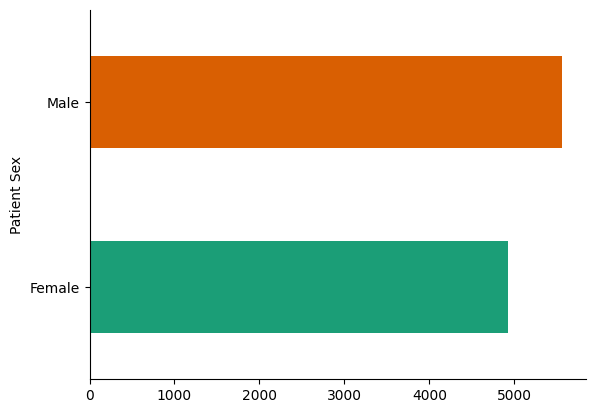

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fulldf.groupby('Patient Sex').size().plot(kind='barh', color=sns.color_palette('Dark2'))
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()


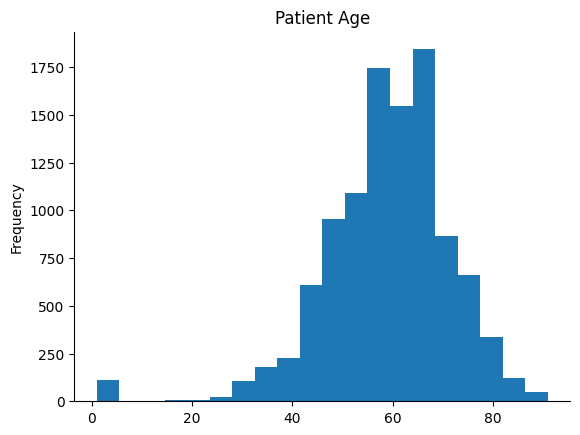

In [ ]:
fulldf['Patient Age'].plot(kind='hist', bins=20, title='Patient Age')
plt.gca().spines[['top', 'right',]].set_visible(False)

<function matplotlib.pyplot.gca() -> 'Axes'>

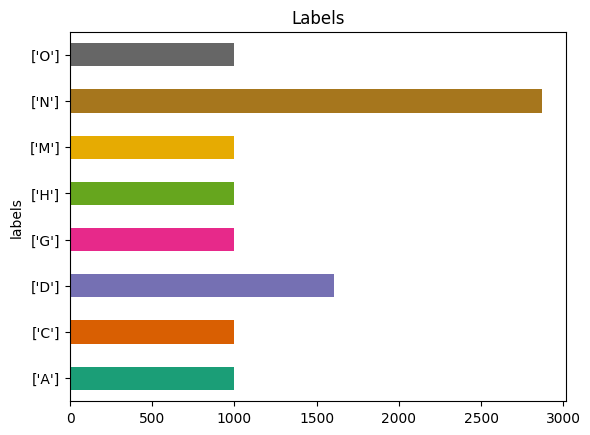

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fulldf.groupby('labels').size().plot(kind='barh', color=sns.color_palette('Dark2'))
plt.title('Labels')
plt.gca


In [ ]:
fulldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10481 entries, 0 to 10480
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   ID                         10481 non-null  int64 
 1   Patient Age                10481 non-null  int64 
 2   Patient Sex                10481 non-null  object
 3   Left-Fundus                10481 non-null  object
 4   Right-Fundus               10481 non-null  object
 5   Left-Diagnostic Keywords   10481 non-null  object
 6   Right-Diagnostic Keywords  10481 non-null  object
 7   N                          10481 non-null  int64 
 8   D                          10481 non-null  int64 
 9   G                          10481 non-null  int64 
 10  C                          10481 non-null  int64 
 11  A                          10481 non-null  int64 
 12  H                          10481 non-null  int64 
 13  M                          10481 non-null  int64 
 14  O     

In [ ]:
print(fulldf.dtypes)

ID                            int64
Patient Age                   int64
Patient Sex                  object
Left-Fundus                  object
Right-Fundus                 object
Left-Diagnostic Keywords     object
Right-Diagnostic Keywords    object
N                             int64
D                             int64
G                             int64
C                             int64
A                             int64
H                             int64
M                             int64
O                             int64
filepath                     object
labels                       object
target                       object
filename                     object
dtype: object


In [3]:
def has_condn(term, text):
    if term in text:
        return 1
    else:
        return 0

In [ ]:
fulldf.describe()

,ID,Patient Age,N,D,G,C,A,H,M,O
count,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000,10481.000000
mean,1915.145120,58.823490,0.200458,0.254842,0.115065,0.110104,0.103330,0.105811,0.106478,0.223452
std,1317.503581,12.499173,0.400362,0.435793,0.319116,0.313034,0.304404,0.307610,0.308464,0.416579
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,831.000000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1594.000000,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2825.000000,67.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4784.000000,91.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
def process_dataset(data):

    data["left_cataract"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("cataract",x))
    data["right_cataract"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("cataract",x))

    data["LD"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("non proliferative retinopathy",x))
    data["RD"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("non proliferative retinopathy",x))

    data["LG"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("glaucoma",x))
    data["RG"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("glaucoma",x))

    data["LH"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("hypertensive",x))
    data["RH"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("hypertensive",x))

    data["LM"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("myopia",x))
    data["RM"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("myopia",x))

    data["LA"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("macular degeneration",x))
    data["RA"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("macular degeneration",x))

    data["LO"] = data["Left-Diagnostic Keywords"].apply(lambda x: has_condn("drusen",x))
    data["RO"] = data["Right-Diagnostic Keywords"].apply(lambda x: has_condn("drusen",x))

    left_cataract_images = data.loc[(data.C ==1) & (data.left_cataract == 1)]["Left-Fundus"].values
    right_cataract_images = data.loc[(data.C == 1) & (data.right_cataract == 1)]["Right-Fundus"].values

    left_normal = data.loc[(data.C == 0) & (data["Left-Diagnostic Keywords"] == "normal fundus")]['Left-Fundus'].sample(1000,random_state=42).values
    right_normal = data.loc[(data.C == 0) & (data["Right-Diagnostic Keywords"] == "normal fundus")]['Right-Fundus'].sample(1000,random_state=42).values

    left_diab = data.loc[(data.C == 0) & (data.LD == 1)]["Left-Fundus"].values
    right_diab = data.loc[(data.C == 0) & (data.RD == 1)]["Right-Fundus"].values

    left_glaucoma = data.loc[(data.C == 0) & (data.LG == 1)]["Left-Fundus"].values
    right_glaucoma = data.loc[(data.C == 0) & (data.RG == 1)]["Right-Fundus"].values

    left_hyper = data.loc[(data.C == 0) & (data.LH == 1)]["Left-Fundus"].values
    right_hyper = data.loc[(data.C == 0) & (data.RH == 1)]["Right-Fundus"].values

    left_myopia = data.loc[(data.C == 0) & (data.LM == 1)]["Left-Fundus"].values
    right_myopia = data.loc[(data.C == 0) & (data.RM == 1)]["Right-Fundus"].values

    left_age = data.loc[(data.C == 0) & (data.LA == 1)]["Left-Fundus"].values
    right_age = data.loc[(data.C == 0) & (data.RA == 1)]["Right-Fundus"].values

    left_other = data.loc[(data.C == 0) & (data.LO == 1)]["Left-Fundus"].values
    right_other = data.loc[(data.C == 0) & (data.RO == 1)]["Right-Fundus"].values

    normalones = np.concatenate((left_normal,right_normal),axis = 0);
    cataractones = np.concatenate((left_cataract_images,right_cataract_images),axis = 0);
    diabones = np.concatenate((left_diab,right_diab),axis = 0);
    glaucoma = np.concatenate((left_glaucoma,right_glaucoma),axis = 0);
    hyper = np.concatenate((left_hyper,right_hyper),axis = 0);
    myopia = np.concatenate((left_myopia,right_myopia),axis = 0);
    age = np.concatenate((left_age,right_age),axis=0);
    other = np.concatenate((left_other,right_other),axis = 0);

    return normalones,cataractones,diabones,glaucoma,hyper,myopia,age,other;

In [5]:
normal , cataract , diab, glaucoma , hyper , myopia , age, other = process_dataset(fulldf);

print("Dataset stats::")
print("Normal ::" , len(normal))
print("Cataract ::" , len(cataract))
print("Diabetes ::" , len(diab))
print("Glaucoma ::" , len(glaucoma))
print("Hypertension ::" , len(hyper))
print("Myopia ::" , len(myopia))
print("Age Issues ::" , len(age))
print("Other ::" , len(other))

Dataset stats::
Normal :: 2000
Cataract :: 1808
Diabetes :: 1980
Glaucoma :: 1960
Hypertension :: 2044
Myopia :: 1860
Age Issues :: 1952
Other :: 452


In [6]:
fulldf_encoded = pd.get_dummies(fulldf)

In [7]:
from sklearn.preprocessing import LabelEncoder

label_encoders = {}
for column in fulldf.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    fulldf[column] = le.fit_transform(fulldf[column])
    label_encoders[column] = le


In [ ]:
print(fulldf.corr())

                                 ID  Patient Age  Patient Sex  Left-Fundus  \
ID                         1.000000    -0.121985     0.049071     0.135336   
Patient Age               -0.121985     1.000000    -0.057705    -0.098084   
Patient Sex                0.049071    -0.057705     1.000000     0.050093   
Left-Fundus                0.135336    -0.098084     0.050093     1.000000   
Right-Fundus               0.135336    -0.098084     0.050093     1.000000   
Left-Diagnostic Keywords   0.260758    -0.163463    -0.033141     0.097251   
Right-Diagnostic Keywords  0.218185    -0.173825    -0.011003     0.068222   
N                          0.359992    -0.083444     0.028391    -0.022368   
D                          0.308110    -0.088421     0.036008     0.398977   
G                         -0.160328     0.104300     0.053463    -0.362067   
C                         -0.028170     0.228454    -0.077674    -0.175758   
A                         -0.218343     0.053497     0.016635   

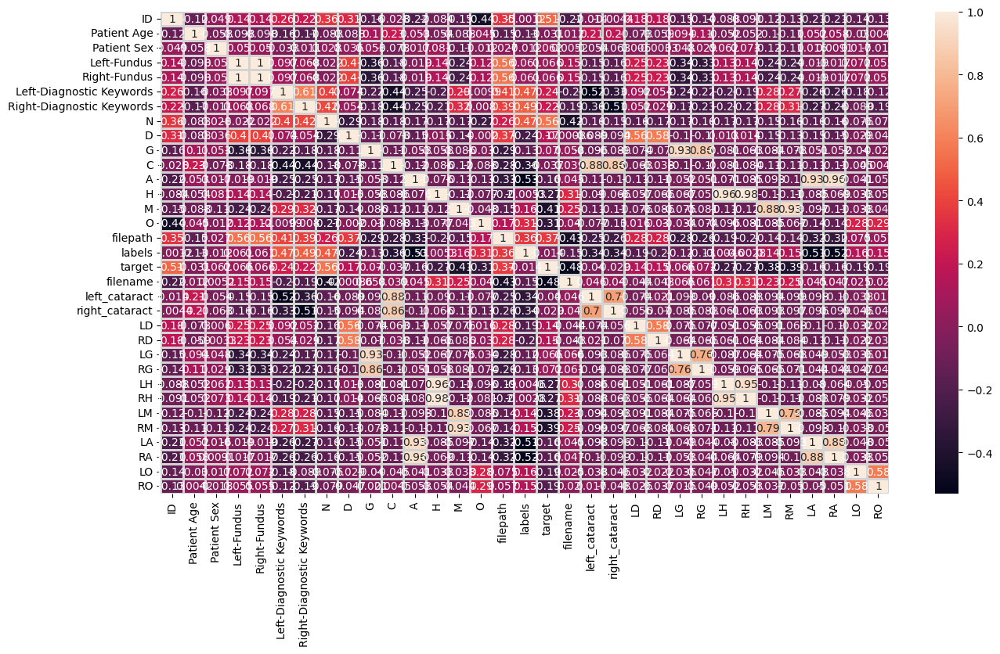

In [ ]:
plt.figure(figsize = (15,8))
sns.heatmap(fulldf.corr(), annot=True, linewidth=2, linecolor = 'lightgray')
plt.show()

In [8]:
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tqdm import tqdm
import cv2
import random

In [9]:
dataset_dir = "merged_images"
image_size=224
labels = []
dataset = []
def data_gen(imagecategory , label):
    for img in tqdm(imagecategory):
        imgpath = os.path.join(dataset_dir,img);

        try:
            image = cv2.imread(imgpath,cv2.IMREAD_COLOR)
            image = cv2.resize(image,(image_size,image_size))
        except:
            continue;
        dataset.append([np.array(image),np.array(label)]);
    random.shuffle(dataset);

    return dataset;

In [10]:
dataset = data_gen(normal,0)
dataset = data_gen(cataract,1)
dataset = data_gen(diab,2)
dataset = data_gen(glaucoma,3)
dataset = data_gen(hyper,4)
dataset = data_gen(myopia,5)
dataset = data_gen(age,6)
dataset = data_gen(other,7)

len(dataset)

100%|██████████| 452/452 [00:00<00:00, 1445.31it/s]


13960

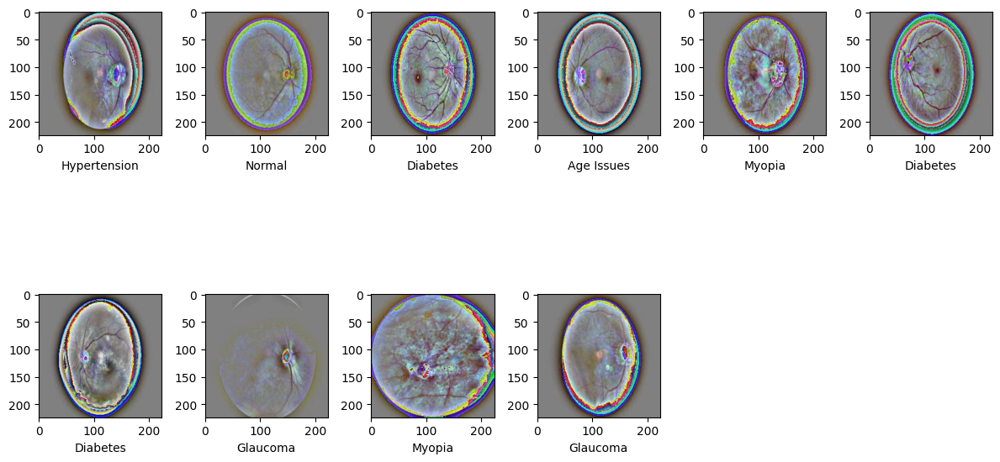

In [ ]:
plt.figure(figsize=(12,7))
for i in range(10):
    sample = random.choice(range(len(dataset)))
    image = dataset[sample][0]
    category = dataset[sample][1]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    plt.subplot(2,6,i+1)
    plt.imshow(image)
    plt.xlabel(label)
plt.tight_layout()

In [11]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

train_x = np.array([i[0] for i in dataset]).reshape(-1,image_size,image_size,3);
train_y = np.array([i[1] for i in dataset])

x_train, x_temp, y_train, y_temp = train_test_split(train_x, train_y, test_size=0.2, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)


y_train_cat = to_categorical(y_train, num_classes=8)
y_val_cat = to_categorical(y_val, num_classes=8)
y_test_cat = to_categorical(y_test, num_classes=8)


#VGG19

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten,Dense,Dropout

In [ ]:
image_size = 224
vgg19 = VGG19(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

In [ ]:
vgg19.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
for layer in vgg19.layers:
    layer.trainable = False

In [ ]:
count = 0
for layer in vgg19.layers:
  count = count +1
print(count)

22


In [ ]:
flat = tf.keras.layers.Flatten() (vgg19.output)
dense1 = tf.keras.layers.Dense(256, activation="relu") (flat)
dense2 = tf.keras.layers.Dense(256, activation="relu") (dense1)
output = tf.keras.layers.Dense(8, activation="softmax") (dense2)

In [ ]:
final_vgg19 = tf.keras.models.Model(inputs=[vgg19.input], outputs=[output])

In [ ]:
final_vgg19.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 26,515,016 (101.15 MB)

 Trainable params: 6,490,632 (24.76 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

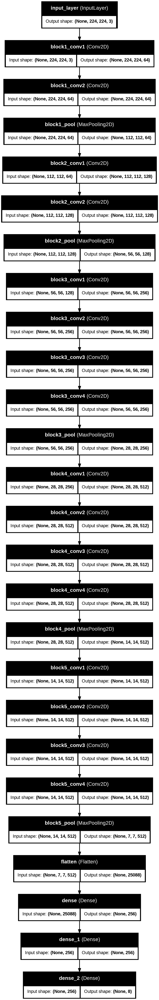

In [ ]:
tf.keras.utils.plot_model(final_vgg19, show_shapes = True, show_layer_names=True)

In [ ]:
final_vgg19.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

class_counts = np.bincount(y_train)
total_samples = np.sum(class_counts)
class_weights = total_samples / (len(class_counts) * class_counts)
class_weight = dict(enumerate(class_weights))

In [12]:
train_data = (x_train, y_train_cat)
validation_data = (x_val, y_val_cat)
test_data = (x_test, y_test_cat)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping_callback = EarlyStopping(
    monitor='val_accuracy',
    patience=40,
    verbose = 1,
    restore_best_weights=True,
    mode = 'max'
)

In [ ]:
history = final_vgg19.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30, class_weight=class_weight, callbacks=[early_stopping_callback])


Epoch 1/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 91s 215ms/step - accuracy: 0.4310 - loss: 14.7885 - val_accuracy: 0.5910 - val_loss: 1.4304
Epoch 2/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 118s 188ms/step - accuracy: 0.6886 - loss: 1.0446 - val_accuracy: 0.6805 - val_loss: 1.1061
Epoch 3/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 78s 178ms/step - accuracy: 0.7545 - loss: 0.7494 - val_accuracy: 0.7722 - val_loss: 0.6868
Epoch 4/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 82s 178ms/step - accuracy: 0.7920 - loss: 0.6279 - val_accuracy: 0.7557 - val_loss: 0.7152
Epoch 5/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 61s 175ms/step - accuracy: 0.8481 - loss: 0.4373 - val_accuracy: 0.7915 - val_loss: 0.7801
Epoch 6/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.8525 - loss: 0.4446 - val_accuracy: 0.7736 - val_loss: 0.7136
Epoch 7/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 62s 177ms/step - accuracy: 0.8621 - loss: 0.3677 - val_accuracy: 0.8095 - val_loss: 0.7209
Epoch 8/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 82s 178ms/step - accuracy: 0.8520 - loss:

In [ ]:
final_vgg19.load_weights("vgg19/vgg19.weights.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import json

with open('vgg19/vgg19_history.json', 'r') as f:
    history = json.load(f)

In [ ]:
import json

history_dict = history.history

# Save the history dictionary to a JSON file
with open('vgg19_history.json', 'w') as f:
    json.dump(history_dict, f)


In [ ]:
train_loss, train_accuracy = final_vgg19.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_vgg19.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_vgg19.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 94.11%
Validation Accuracy: 94.05%
Test Accuracy: 94.48%


In [ ]:
final_vgg19.save_weights("vgg19.weights.h5")

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_vgg19.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step
[0, 5, 1, 1, 7, 6, 5, 0, 1, 6, 2, 2, 0, 2, 0, 3, 6, 0, 4, 4, 2, 6, 7, 6, 4, 3, 3, 6, 6, 0, 0, 0, 6, 2, 2, 3, 6, 2, 6, 3, 6, 5, 0, 0, 1, 5, 2, 4, 1, 0, 2, 3, 1, 4, 0, 4, 4, 3, 7, 4, 6, 5, 3, 1, 2, 3, 0, 0, 4, 3, 4, 6, 7, 0, 4, 0, 0, 4, 0, 4, 1, 4, 6, 6, 6, 3, 2, 1, 6, 4, 4, 4, 1, 2, 6, 6, 6, 1, 0, 3, 1, 1, 0, 0, 3, 3, 1, 1, 4, 4, 2, 4, 5, 2, 7, 4, 5, 0, 5, 0, 2, 0, 5, 5, 5, 4, 1, 2, 1, 3, 0, 6, 6, 6, 0, 5, 4, 0, 4, 5, 2, 0, 1, 1, 1, 5, 6, 0, 6, 6, 5, 0, 6, 2, 3, 0, 2, 0, 5, 2, 3, 5, 4, 5, 2, 4, 3, 4, 6, 3, 3, 6, 0, 2, 3, 1, 4, 1, 2, 4, 1, 0, 3, 0, 0, 6, 0, 4, 0, 6, 0, 2, 6, 3, 2, 1, 0, 2, 6, 6, 6, 1, 4, 2, 2, 6, 6, 0, 6, 5, 0, 1, 6, 6, 0, 4, 0, 4, 3, 3, 4, 0, 5, 5, 5, 2, 1, 6, 1, 4, 5, 2, 6, 3, 2, 1, 3, 5, 1, 4, 1, 5, 4, 5, 0, 5, 1, 4, 7, 1, 6, 0, 2, 3, 0, 0, 3, 1, 5, 6, 3, 3, 3, 3, 0, 5, 0, 6, 5, 4, 3, 0, 0, 0, 0, 1, 4, 5, 6, 2, 0, 6, 5, 4, 6, 5, 3, 3, 4, 2, 3, 4, 4, 1, 6, 2, 5, 0, 0, 3, 4, 3, 5, 0, 0, 4, 7, 1, 2, 0, 4, 1, 4, 2, 4, 2, 6, 4, 6, 3

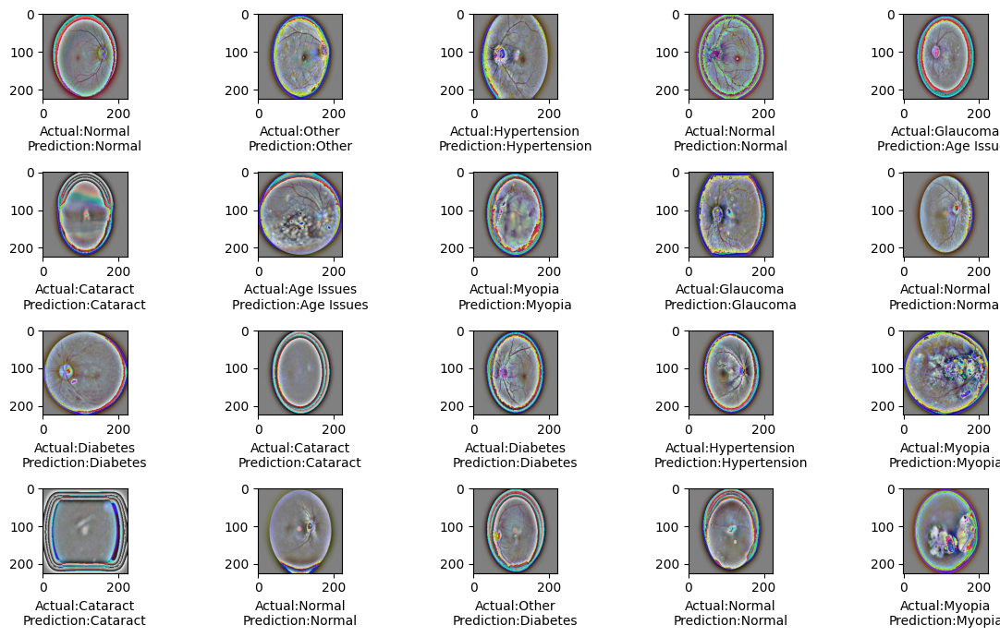

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_vgg19.save("ODIR_VGG19.h5")

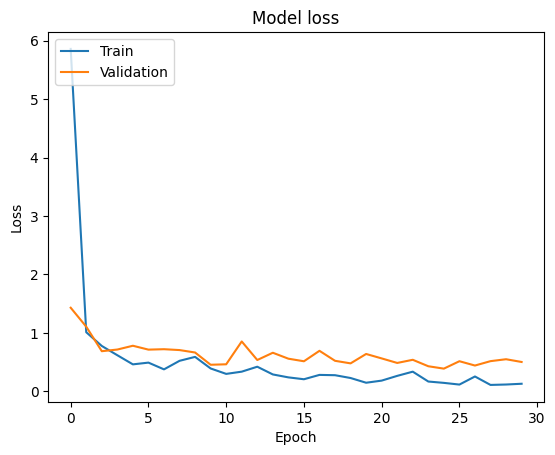

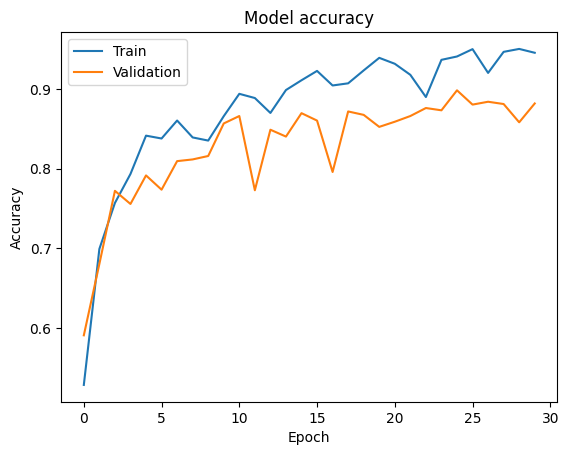

In [ ]:
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_vgg19.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       221
           1       0.99      0.96      0.98       195
           2       0.83      0.97      0.90       170
           3       0.92      0.87      0.89       185
           4       0.96      0.94      0.95       205
           5       1.00      0.96      0.98       182
           6       0.95      0.95      0.95       200
           7       0.94      0.89      0.92        38

    accuracy                           0.94      1396
   macro avg       0.95      0.94      0.94      1396
weighted avg       0.95      0.94      0.95      1396



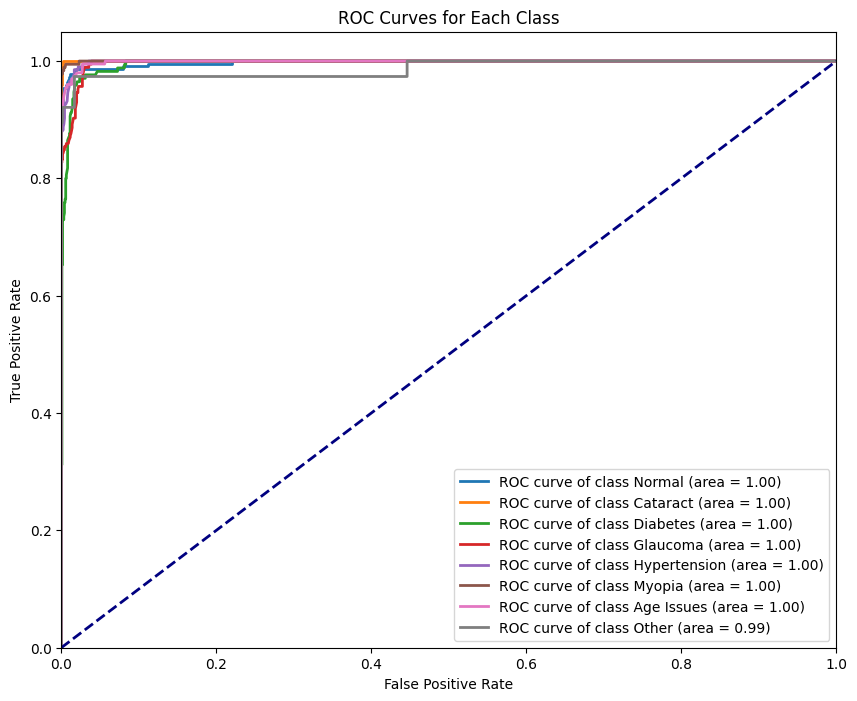

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Binarize the output labels
y_test_bin = label_binarize(y_true_classes, classes=np.arange(8))
y_pred_bin = y_pred

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# VGG16

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16

In [ ]:
input_shape = (224, 224, 3)
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
vgg16.summary()


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
for layer in vgg16.layers:
    layer.trainable = False

In [ ]:
flat = tf.keras.layers.Flatten() (vgg16.output)
dense1 = tf.keras.layers.Dense(256, activation="relu") (flat)
dropout1 = Dropout(0.5)(dense1)
dense2 = tf.keras.layers.Dense(128, activation="relu") (dropout1)
dropout2 = Dropout(0.5)(dense2)
output = Dense(8, activation="softmax")(dropout2)

In [ ]:
final_vgg16 = tf.keras.models.Model(inputs=[vgg16.input], outputs=[output])

In [ ]:
final_vgg16.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,171,400 (80.76 MB)

 Trainable params: 6,456,712 (24.63 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
count = 0
for layer in final_vgg16.layers:
  count = count +1
print(count)

25


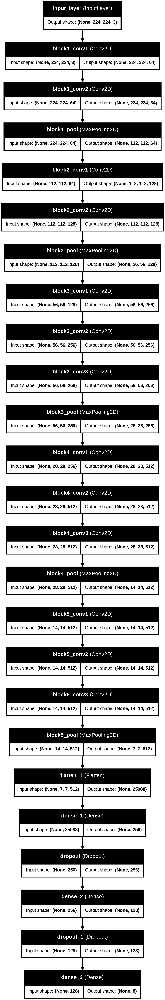

In [ ]:
tf.keras.utils.plot_model(final_vgg16, show_shapes = True, show_layer_names=True)

In [ ]:
from tensorflow.keras.optimizers import Adam

final_vgg16.compile(optimizer=Adam(learning_rate=1e-4),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

In [ ]:
history = final_vgg16.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30)


Epoch 1/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 81s 185ms/step - accuracy: 0.1953 - loss: 8.9950 - val_accuracy: 0.3496 - val_loss: 1.7816
Epoch 2/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - accuracy: 0.2520 - loss: 1.9658 - val_accuracy: 0.3589 - val_loss: 1.7241
Epoch 3/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 77s 141ms/step - accuracy: 0.2920 - loss: 1.8536 - val_accuracy: 0.3976 - val_loss: 1.5989
Epoch 4/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 87s 154ms/step - accuracy: 0.3095 - loss: 1.7729 - val_accuracy: 0.4019 - val_loss: 1.5615
Epoch 5/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 82s 154ms/step - accuracy: 0.3075 - loss: 1.7660 - val_accuracy: 0.4033 - val_loss: 1.5489
Epoch 6/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 77s 140ms/step - accuracy: 0.3087 - loss: 1.7133 - val_accuracy: 0.4033 - val_loss: 1.5352
Epoch 7/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 82s 140ms/step - accuracy: 0.3208 - loss: 1.6838 - val_accuracy: 0.4069 - val_loss: 1.5110
Epoch 8/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 87s 154ms/step - accuracy: 0.3283 - loss: 1

In [ ]:
final_vgg16.load_weights("vgg16.weights.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import json

history_dict = history.history

# Save the history dictionary to a JSON file
with open('vgg16_history.json', 'w') as f:
    json.dump(history_dict, f)


In [ ]:
# prompt: save model weights

final_vgg16.save_weights("vgg16.weights.h5")

In [ ]:
import json

with open('vgg16_history.json', 'r') as f:
    history = json.load(f)

In [ ]:
train_loss, train_accuracy = final_vgg16.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_vgg16.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_vgg16.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 42.34%
Validation Accuracy: 42.91%
Test Accuracy: 41.48%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_vgg16.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step
[4, 4, 5, 4, 5, 4, 4, 4, 5, 5, 1, 1, 5, 1, 5, 4, 4, 4, 4, 4, 1, 4, 5, 4, 4, 1, 1, 4, 4, 4, 5, 4, 4, 5, 4, 1, 4, 4, 4, 3, 4, 4, 4, 1, 4, 4, 4, 1, 4, 5, 5, 4, 4, 4, 4, 4, 3, 1, 4, 4, 4, 4, 4, 4, 5, 4, 3, 4, 4, 5, 4, 1, 5, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 1, 3, 4, 4, 5, 4, 4, 5, 4, 4, 4, 1, 1, 4, 4, 4, 1, 4, 4, 4, 1, 4, 4, 5, 4, 4, 4, 4, 4, 3, 4, 5, 4, 4, 4, 4, 4, 4, 1, 4, 1, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 5, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 4, 1, 4, 4, 4, 5, 4, 1, 4, 4, 4, 4, 4, 1, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 5, 4, 4, 5, 4, 4, 4, 4, 4, 5, 1, 4, 4, 4, 4, 4, 4, 1, 5, 4, 4, 5, 5, 5, 1, 4, 4, 5, 3, 4, 4, 5, 5, 4, 5, 4, 4, 4, 4, 5, 4, 4, 4, 1, 5, 4, 4, 4, 4, 1, 4, 1, 4, 4, 4, 5, 1, 4, 4, 4, 4, 4, 4, 4, 4, 1, 4, 4, 1, 5, 1, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 4, 4, 1, 1, 4, 4, 4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 5, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 3, 4, 4, 5, 5, 4, 4, 1, 4, 4, 4, 1, 4

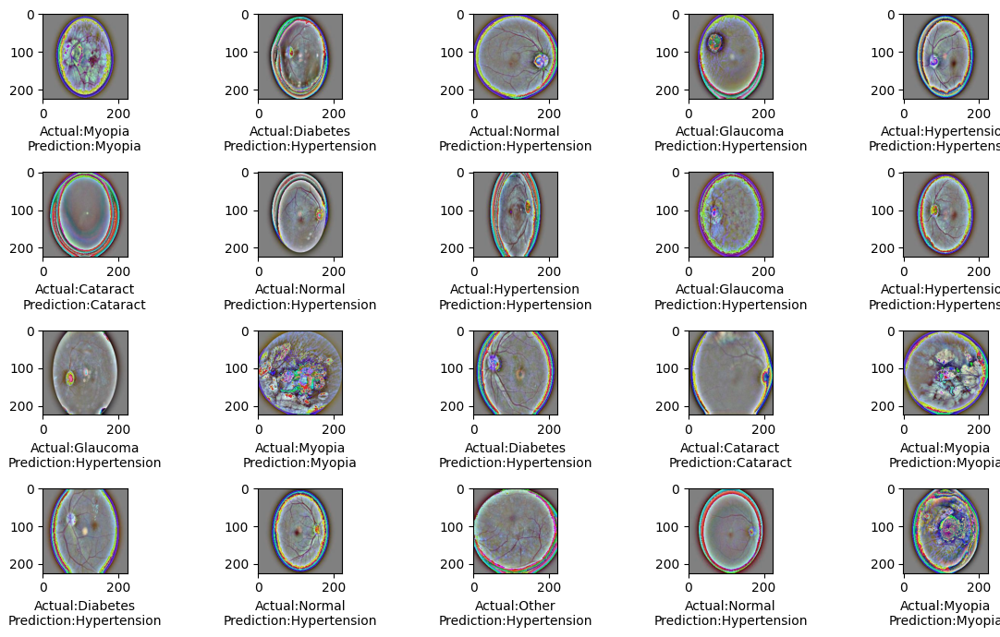

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_vgg16.save("ODIR_VGG16.h5")

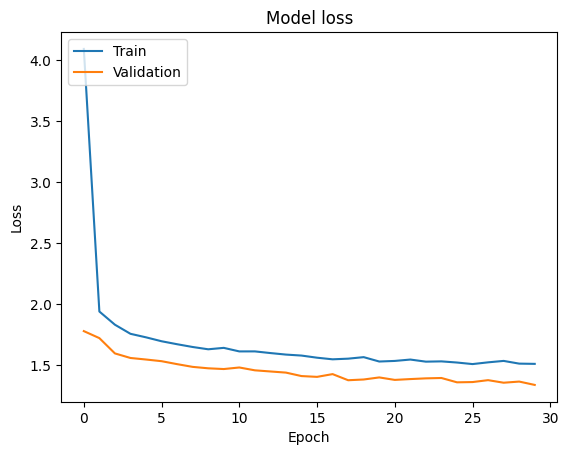

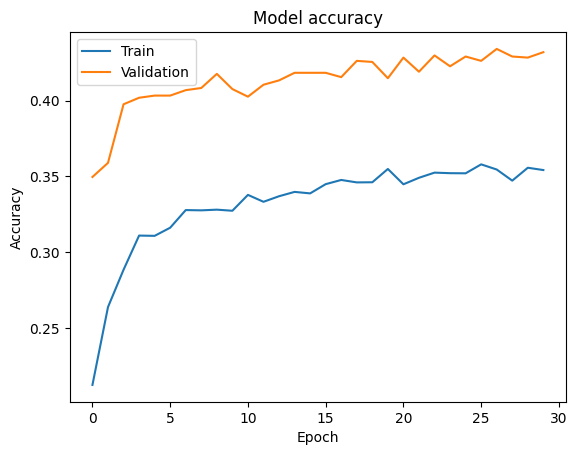

In [ ]:
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

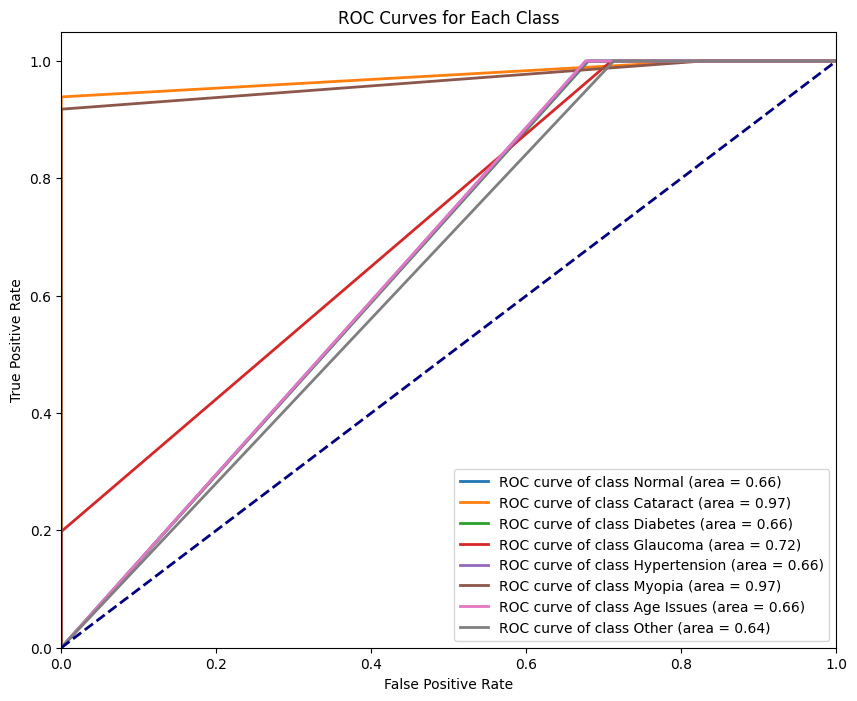

In [ ]:
# prompt: plot auc roc curve, dont plot minor avg curve

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output labels
y_test_bin = label_binarize(np.argmax(y_test_cat, axis=1), classes=np.arange(8))
y_pred_bin = y_pred

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_vgg16.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       198
           1       1.00      0.94      0.97       180
           2       0.00      0.00      0.00       186
           3       1.00      0.20      0.33       197
           4       0.19      1.00      0.32       192
           5       1.00      0.92      0.96       195
           6       0.00      0.00      0.00       200
           7       0.00      0.00      0.00        48

    accuracy                           0.41      1396
   macro avg       0.40      0.38      0.32      1396
weighted avg       0.44      0.41      0.35      1396



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# Resnet 34

In [14]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

In [15]:
resnet34 = models.resnet34(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 95.4MB/s]


In [16]:
num_features = resnet34.fc.in_features
resnet34.fc = nn.Linear(num_features, 8)

In [ ]:
print(resnet34)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [17]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet34.parameters(), lr=1e-4)

In [18]:
from torchvision import datasets

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])



In [19]:
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

from PIL import Image

class OcularDataset(Dataset):
    def __init__(self, data, labels, transform=None):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        image = Image.fromarray(self.data[idx].astype('uint8'))

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]
        if len(label.shape) > 1 and label.shape[-1] > 1:
            label = torch.argmax(torch.tensor(label), dim=-1)
        else:
            label = torch.tensor(label)

        return image, label

train_dataset = OcularDataset(data=x_train, labels=y_train_cat, transform=transform)
val_dataset = OcularDataset(data=x_val, labels=y_val_cat, transform=transform)
test_dataset = OcularDataset(data=x_test, labels=y_test_cat, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet34 = resnet34.to(device)

In [21]:
resnet34.load_state_dict(torch.load("resnet34_ocular.pth"))

<ipython-input-21-40c7a3e5fd56>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet34.load_state_dict(torch.load("resnet34_ocular.pth"))


<All keys matched successfully>

In [ ]:
import torch
import matplotlib.pyplot as plt

# Training Loop with Metrics Tracking
num_epochs = 5
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

for epoch in range(num_epochs):
    resnet34.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = resnet34(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)

        # Convert one-hot encoded labels to class indices
        labels_indices = torch.argmax(labels, dim=1) # get the indices of the true labels.

        # Now compare predicted with the class indices of labels.
        correct += (predicted == labels_indices).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_loss_history.append(train_loss)
    train_acc_history.append(train_acc)

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%', end=" ")

    resnet34.eval()
    val_running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = resnet34(images)
            loss = criterion(outputs,labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)

            total += labels.size(0)

            # Convert one-hot encoded labels to class indices
            labels_indices = torch.argmax(labels, dim=1)

            correct += (predicted == labels_indices).sum().item()

        val_loss = val_running_loss/len(val_loader)
        val_acc = 100 * correct / total
        val_loss_history.append(val_loss)
        val_acc_history.append(val_acc)

        print(f'Val Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.2f}%')

torch.save(resnet34.state_dict(), 'resnet34_ocular.pth')

Epoch [1/5], Train Loss: 0.0933, Train Acc: 95.52% Val Loss: 0.3649, Validation Accuracy: 88.83%
Epoch [2/5], Train Loss: 0.0827, Train Acc: 95.73% Val Loss: 0.2823, Validation Accuracy: 90.19%
Epoch [3/5], Train Loss: 0.0797, Train Acc: 95.66% Val Loss: 0.3424, Validation Accuracy: 89.33%
Epoch [4/5], Train Loss: 0.0782, Train Acc: 95.66% Val Loss: 0.4580, Validation Accuracy: 87.89%
Epoch [5/5], Train Loss: 0.0850, Train Acc: 95.59% Val Loss: 0.3154, Validation Accuracy: 90.47%


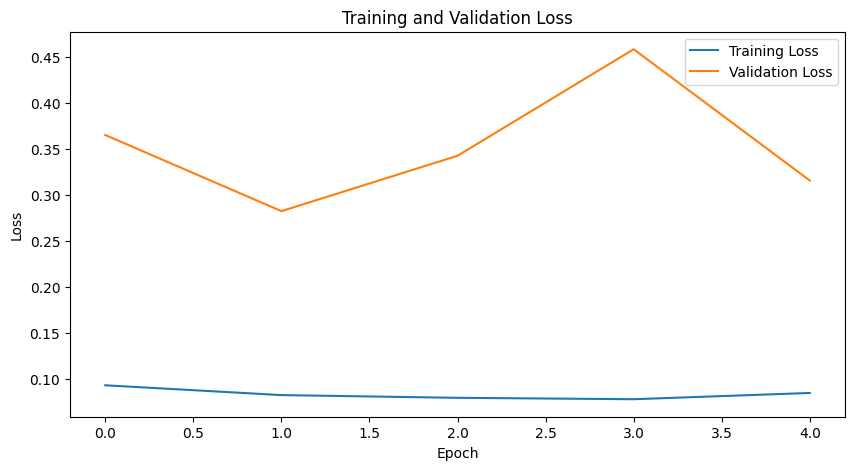

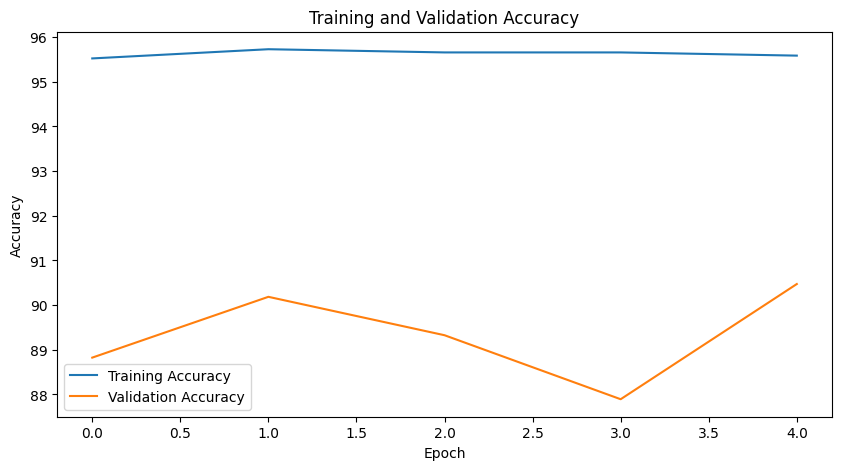

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss_history, label='Training Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_acc_history, label='Training Accuracy')
plt.plot(val_acc_history, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
import json

# Resnet34 - Save the training and validation metrics to a JSON file
resnet_history = {
    'train_loss': train_loss_history,
    'train_accuracy': train_acc_history,
    'val_loss': val_loss_history,
    'val_accuracy': val_acc_history
}
with open('resnet34_history.json', 'w') as f:
    json.dump(resnet_history, f)

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        if len(labels.shape) > 1 and labels.shape[-1] > 1:
            labels = torch.argmax(labels, dim=1)

        outputs = resnet34(images)
        _, predicted = torch.max(outputs.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * correct / total}%')


Test Accuracy: 95.34383954154728%


In [22]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import random
import numpy as np

In [23]:
resnet34.eval()

y_pred = []
y_true = []

In [24]:
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = resnet34(images)
        _, predicted = torch.max(outputs.data, 1)


        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())


In [25]:
y_pred = np.array(y_pred)
y_true = np.array(y_true)

In [26]:
if len(y_true.shape) > 1 and y_true.shape[1] > 1:
    y_true = np.argmax(y_true, axis=1)

In [ ]:
print("Accuracy Score:", accuracy_score(y_true, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))
print("Classification Report:")
print(classification_report(y_true, y_pred))

Accuracy Score: 0.9577363896848138
Confusion Matrix:
[[215   0   3   2   0   0   0   2]
 [  0 157   0   0   0   0   0   0]
 [  6   0 174   1  10   3   1   2]
 [  0   0   5 196   0   0   0   1]
 [  0   0   1   3 199   0   6   0]
 [  0   0   0   3   0 183   1   0]
 [  0   0   0   9   0   0 163   0]
 [  0   0   0   0   0   0   0  50]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       222
           1       1.00      1.00      1.00       157
           2       0.95      0.88      0.92       197
           3       0.92      0.97      0.94       202
           4       0.95      0.95      0.95       209
           5       0.98      0.98      0.98       187
           6       0.95      0.95      0.95       172
           7       0.91      1.00      0.95        50

    accuracy                           0.96      1396
   macro avg       0.95      0.96      0.96      1396
weighted avg       0.96      0.96      0.96    

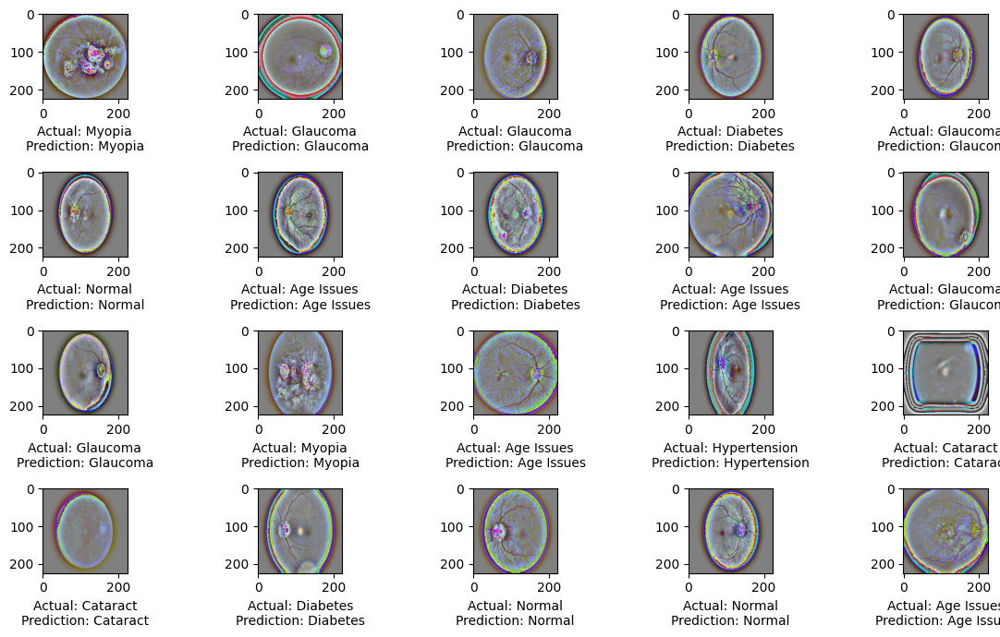

In [ ]:
import random


def visualize_samples(x_data, y_true, y_pred, labels, num_samples=20):
    plt.figure(figsize=(12, 7))
    for i in range(num_samples):
        sample = random.choice(range(len(x_data)))
        image = x_data[sample]

        if isinstance(image, torch.Tensor):
            image = image.cpu().numpy()


        if image.ndim == 3 and image.shape[0] == 3:
            image = np.transpose(image, (1, 2, 0))

        if image.max() > 1:
            image = (image - image.min()) / (image.max() - image.min())  # Normalize to [0, 1]

        category = y_true[sample]
        pred_category = y_pred[sample]

        label = labels[category]
        pred_label = labels[pred_category]

        plt.subplot(4, 5, i + 1)
        plt.imshow(image)
        plt.xlabel(f"Actual: {label}\nPrediction: {pred_label}")

    plt.tight_layout()
    plt.show()

# Define labels
labels = ["Normal", "Cataract", "Diabetes", "Glaucoma", "Hypertension", "Myopia", "Age Issues", "Other"]

# Assuming y_true and y_pred are numpy arrays of true and predicted labels
visualize_samples(x_test, y_true, y_pred, labels)


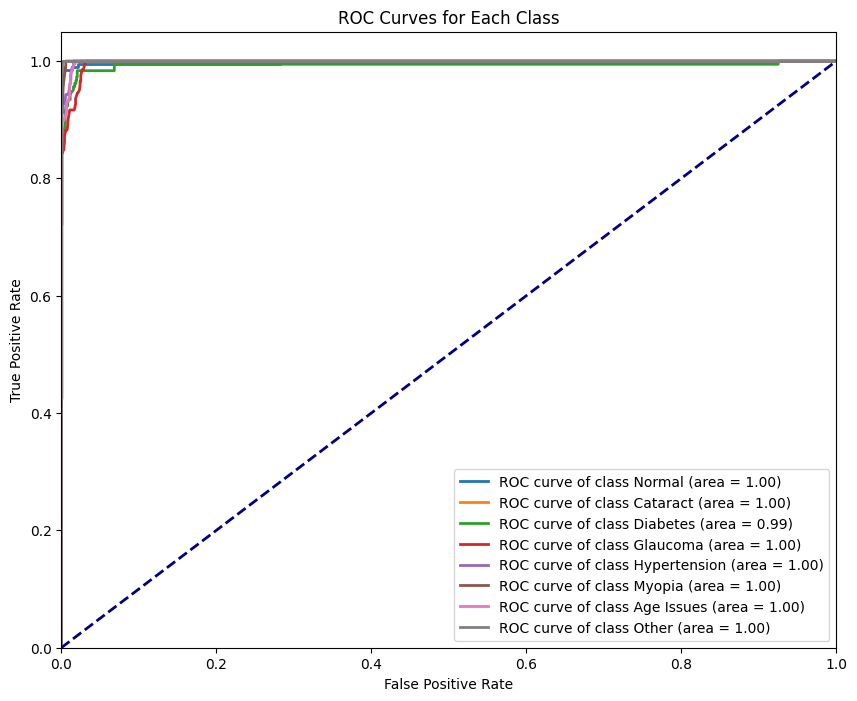

In [29]:
# prompt: generate auc curve

from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming y_test_cat and y_pred are defined from previous code
# y_test_cat: One-hot encoded true labels
# y_pred: Predicted probabilities from your model

class_names = ["Normal", "Cataract", "Diabetes", "Glaucoma", "Hypertension", "Myopia", "Age Issues", "Other"]

# Convert one-hot encoded labels back to class indices
y_true_classes = np.argmax(y_test_cat, axis=1)

# Binarize the output labels
y_test_bin = label_binarize(y_true_classes, classes=np.arange(8))
n_classes = y_test_bin.shape[1]

# Get predicted probabilities for each class using the trained ResNet34 model
resnet34.eval()  # Set the model to evaluation mode
y_pred_probs = []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = resnet34(images)
        probs = torch.softmax(outputs, dim=1)  # Apply softmax to get probabilities
        y_pred_probs.extend(probs.cpu().numpy())

y_pred_probs = np.array(y_pred_probs)  # Convert to numpy array

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_pred_probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Efficient Net

In [4]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers

In [6]:
image_size = 224
efficientnet = EfficientNetB0(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
for layer in efficientnet.layers:
    layer.trainable = True

In [ ]:
efficientnet.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
flat = layers.Flatten()(efficientnet.output)
dense1 = layers.Dense(2048, activation="relu")(flat)
dropout1 = layers.Dropout(0.4)(dense1)
dense2 = layers.Dense(2048, activation="relu")(dropout1)
dropout2 = layers.Dropout(0.4)(dense2)
output = layers.Dense(8, activation="softmax")(dropout2)

In [ ]:
final_efficient = tf.keras.models.Model(inputs=[efficientnet.input], outputs=[output])

In [ ]:
final_efficient.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 136,714,923 (521.53 MB)

 Trainable params: 136,672,900 (521.37 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
count = 0
for layer in final_efficient.layers:
  count = count +1
print(count)



244


In [ ]:
from tensorflow.keras.optimizers import SGD

final_efficient.compile(optimizer=SGD(learning_rate=3e-4, momentum=0.9),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
history = final_efficient.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30, class_weight=class_weight)


In [ ]:
# prompt: save model training history

import json

# Assuming 'history' is the training history object returned by model.fit
history_dict = history.history

# Save the history dictionary to a JSON file
with open('efficientnet_history.json', 'w') as f:
    json.dump(history_dict, f)

In [ ]:
# prompt: save model weights

final_efficient.save_weights("efficientnet.weights.h5")

In [ ]:
final_efficient.load_weights("efficientnet.weights.h5")

In [ ]:
import json
with open('efficientnet_history.json', 'r') as f:
    history = json.load(f)


In [ ]:
train_loss, train_accuracy = final_efficient.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_efficient.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_efficient.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 63.67%
Validation Accuracy: 59.10%
Test Accuracy: 62.89%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_efficient.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 227ms/step
[0, 0, 0, 0, 4, 6, 0, 6, 4, 2, 0, 2, 2, 3, 1, 5, 6, 3, 5, 3, 6, 3, 2, 4, 2, 3, 3, 0, 3, 1, 2, 1, 2, 0, 1, 2, 0, 1, 6, 0, 5, 5, 0, 2, 0, 4, 2, 4, 3, 6, 5, 2, 1, 0, 0, 0, 2, 2, 1, 0, 6, 5, 6, 0, 0, 5, 6, 1, 1, 1, 5, 0, 6, 4, 1, 2, 1, 5, 0, 0, 4, 2, 0, 1, 6, 5, 6, 0, 1, 2, 6, 4, 1, 3, 1, 3, 2, 1, 4, 5, 2, 0, 1, 0, 2, 0, 0, 0, 4, 5, 0, 5, 6, 6, 5, 0, 6, 3, 3, 2, 2, 0, 1, 0, 3, 0, 2, 4, 0, 5, 5, 1, 3, 3, 2, 2, 3, 0, 1, 0, 2, 0, 3, 2, 5, 5, 0, 0, 5, 0, 1, 0, 3, 4, 4, 3, 1, 1, 6, 0, 0, 0, 3, 5, 6, 0, 6, 5, 3, 0, 3, 4, 0, 3, 0, 2, 5, 2, 3, 5, 1, 4, 0, 3, 1, 2, 0, 0, 6, 1, 1, 5, 3, 0, 1, 5, 0, 3, 2, 3, 5, 1, 5, 4, 4, 0, 5, 1, 1, 0, 6, 6, 3, 5, 3, 0, 6, 3, 0, 2, 6, 6, 5, 1, 5, 2, 6, 4, 6, 1, 3, 0, 0, 1, 0, 2, 5, 5, 6, 1, 2, 0, 5, 5, 2, 4, 1, 5, 3, 6, 2, 2, 6, 1, 1, 4, 0, 4, 3, 1, 5, 6, 0, 3, 0, 0, 0, 0, 1, 0, 1, 1, 1, 6, 0, 0, 6, 0, 2, 2, 3, 6, 6, 5, 6, 1, 2, 0, 0, 1, 0, 4, 0, 4, 0, 1, 1, 0, 1, 2, 5, 6, 2, 0, 0, 3, 0, 0, 0, 0, 6, 4, 4, 2, 6, 2, 0, 2, 0, 

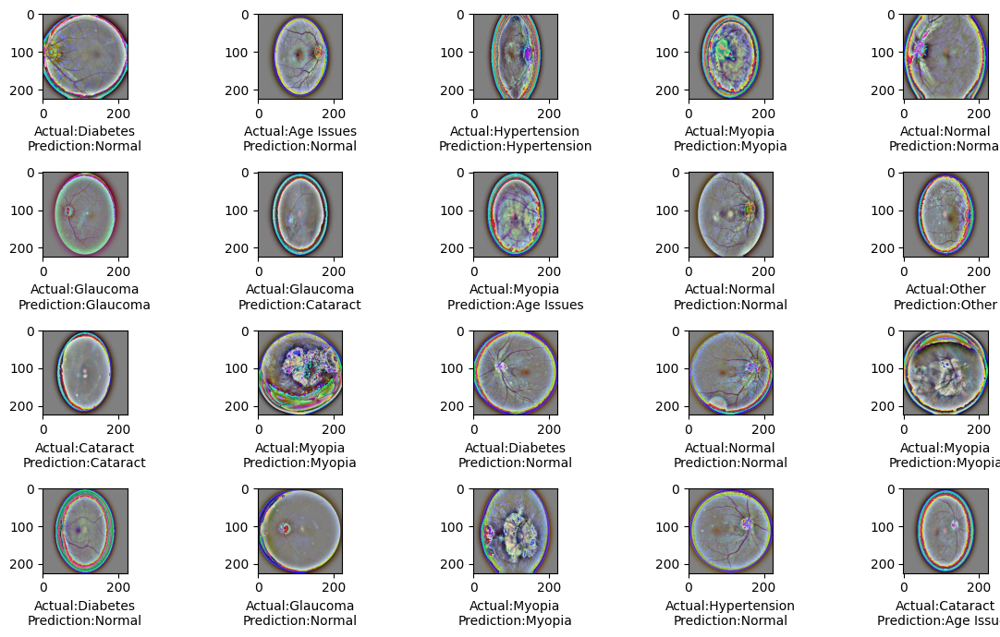

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_efficient.save("ODIR_efficient.h5")

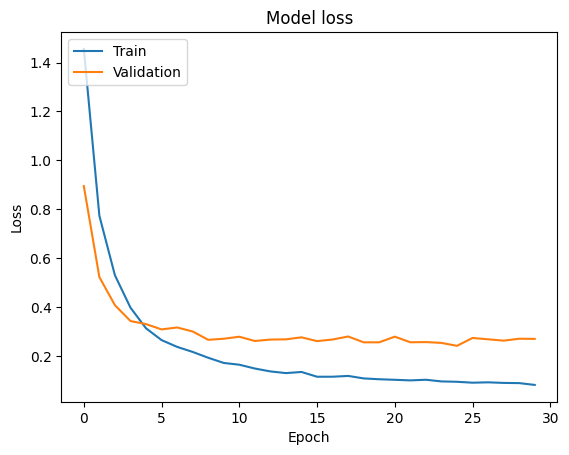

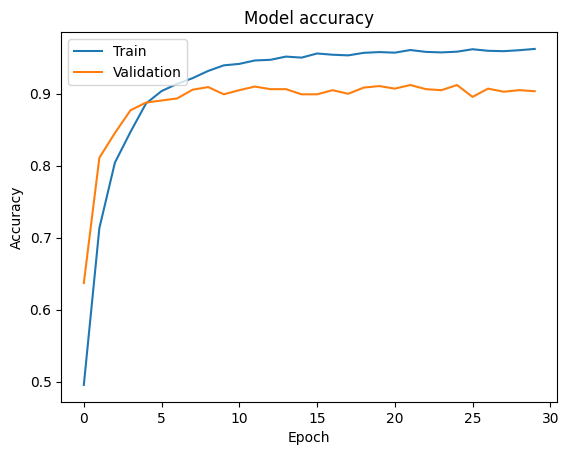

In [ ]:
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_efficient.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
              precision    recall  f1-score   support

           0       0.41      0.81      0.55       196
           1       0.82      0.89      0.85       189
           2       0.50      0.51      0.51       187
           3       0.80      0.52      0.63       188
           4       0.88      0.44      0.58       213
           5       0.85      0.92      0.89       180
           6       0.68      0.64      0.66       203
           7       0.83      0.12      0.22        40

    accuracy                           0.65      1396
   macro avg       0.72      0.61      0.61      1396
weighted avg       0.71      0.65      0.65      1396



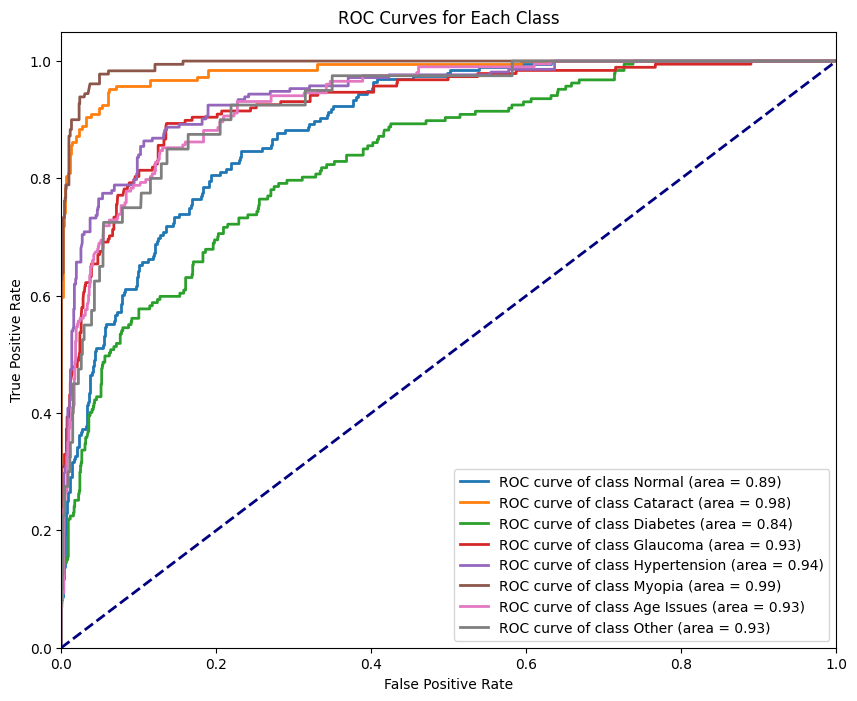

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np

# Binarize the output labels
y_test_bin = label_binarize(np.argmax(y_test_cat, axis=1), classes=np.arange(8))
y_pred_bin = y_pred  # Assuming y_pred contains probabilities for each class

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# Inception V3

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
inception = InceptionV3(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
for layer in inception.layers:
    layer.trainable = False

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Flatten,Dense
from tensorflow.keras import Model
flat = Flatten()(inception.output)
output = Dense(8, activation="sigmoid")(flat)

In [ ]:
final_inception = tf.keras.models.Model(inputs=[inception.input], outputs=[output])

In [ ]:
final_inception.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 111, 111, 32)   │            864 │ input_layer_6[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 111, 111, 32)   │             96 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 109, 109, 32)   │          9,216 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_8     │ (None, 109, 109, 32)   │             96 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 109, 109, 32)   │              0 │ batch_normalization_8… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 109, 109, 64)   │         18,432 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_9     │ (None, 109, 109, 64)   │            192 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 109, 109, 64)   │              0 │ batch_normalization_9… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 54, 54, 64)     │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 54, 54, 80)     │          5,120 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_10    │ (None, 54, 54, 80)     │            240 │ conv2d_7[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 54, 54, 80)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 52, 52, 192)    │        138,240 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 52, 52, 192)    │            576 │ conv2d_8[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 22,212,392 (84.73 MB)

 Trainable params: 409,608 (1.56 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
final_inception.compile(optimizer="adam",loss="binary_crossentropy",metrics=["accuracy"])


In [ ]:
count = 0
for layer in final_inception.layers:
  count = count +1
print(count)



313


In [ ]:
history = final_inception.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=25, callbacks=[early_stopping_callback])


In [ ]:
final_inception.load_weights("inceptionV3.weights.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
train_loss, train_accuracy = final_inception.evaluate(train_data[0], train_data[1], verbose=0)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = final_inception.evaluate(validation_data[0], validation_data[1], verbose=0)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = final_inception.evaluate(test_data[0], test_data[1], verbose=0)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Training Accuracy: 91.72%
Validation Accuracy: 91.33%
Test Accuracy: 90.47%


In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
y_pred = []
for i in final_inception.predict(x_test):
    y_pred.append(np.argmax(np.array(i)).astype("int32"))

print(y_pred)

44/44 ━━━━━━━━━━━━━━━━━━━━ 13s 202ms/step
[0, 6, 6, 1, 3, 3, 6, 2, 3, 4, 4, 5, 6, 3, 0, 6, 1, 6, 2, 2, 0, 4, 0, 4, 4, 4, 0, 3, 2, 6, 6, 6, 5, 6, 3, 0, 0, 6, 4, 5, 2, 2, 4, 3, 5, 3, 5, 6, 4, 2, 6, 2, 2, 2, 0, 2, 3, 6, 5, 5, 5, 0, 1, 4, 0, 4, 2, 4, 1, 4, 3, 5, 4, 6, 6, 3, 0, 0, 6, 0, 6, 3, 6, 5, 3, 1, 0, 1, 2, 0, 1, 1, 4, 0, 0, 6, 3, 4, 0, 3, 2, 6, 1, 0, 6, 3, 4, 6, 1, 2, 2, 6, 4, 1, 1, 4, 2, 6, 2, 4, 4, 4, 4, 4, 5, 6, 6, 7, 6, 5, 5, 1, 5, 5, 1, 4, 2, 1, 3, 4, 5, 6, 5, 1, 0, 7, 5, 2, 2, 4, 4, 0, 0, 1, 7, 6, 2, 6, 4, 3, 5, 2, 6, 5, 2, 3, 4, 6, 0, 5, 4, 2, 4, 5, 5, 0, 2, 5, 2, 5, 3, 5, 4, 4, 4, 5, 2, 0, 4, 0, 6, 5, 5, 2, 6, 2, 4, 3, 6, 3, 4, 4, 1, 4, 4, 3, 5, 5, 2, 2, 1, 5, 0, 2, 5, 1, 3, 6, 3, 0, 0, 0, 2, 6, 2, 2, 6, 4, 4, 0, 4, 4, 4, 4, 5, 5, 0, 6, 1, 3, 2, 1, 4, 3, 6, 2, 2, 6, 0, 6, 5, 3, 2, 0, 4, 3, 4, 3, 6, 2, 4, 3, 1, 5, 0, 2, 0, 4, 1, 2, 6, 6, 0, 4, 5, 3, 1, 6, 2, 6, 5, 3, 4, 3, 1, 6, 6, 1, 6, 3, 1, 2, 0, 2, 2, 4, 6, 6, 0, 0, 4, 0, 6, 6, 6, 2, 4, 3, 2, 5, 5, 6, 4, 5, 5, 0, 2, 6, 0, 

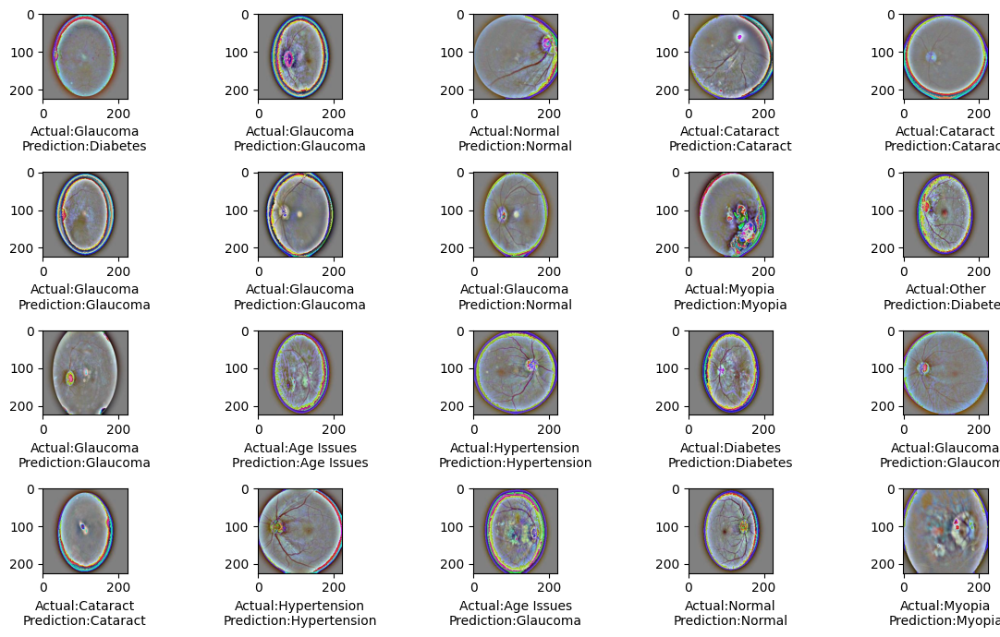

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
final_inception.save("ODIR_inception.h5")

In [ ]:
# prompt: load history "inceptionV3_history.json"

import json

with open('inceptionV3_history.json', 'r') as f:
    history = json.load(f)

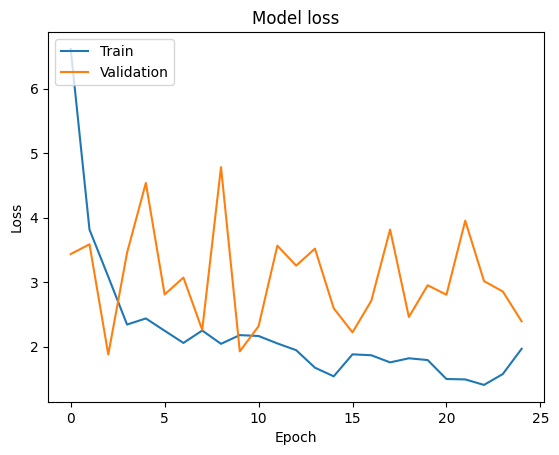

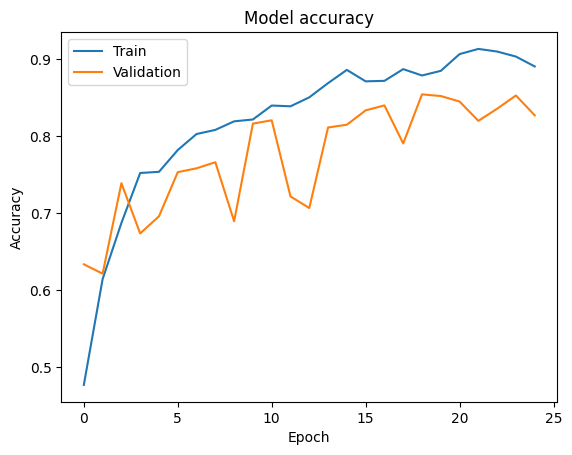

In [ ]:
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

class_names = ['Normal', 'Cataract', 'Diabetes', 'Glaucoma', 'Hypertension', 'Myopia', 'Age Issues', 'Other']
y_pred = final_inception.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)

y_true_classes = np.argmax(y_test_cat, axis=1)

report = classification_report(y_true_classes, y_pred_classes)
print(report)

44/44 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
              precision    recall  f1-score   support

           0       0.92      0.84      0.88       222
           1       1.00      0.99      1.00       157
           2       0.81      0.90      0.85       197
           3       0.98      0.85      0.91       202
           4       0.93      0.93      0.93       209
           5       0.98      0.97      0.97       187
           6       0.76      0.98      0.85       172
           7       0.97      0.58      0.72        50

    accuracy                           0.90      1396
   macro avg       0.92      0.88      0.89      1396
weighted avg       0.91      0.90      0.90      1396



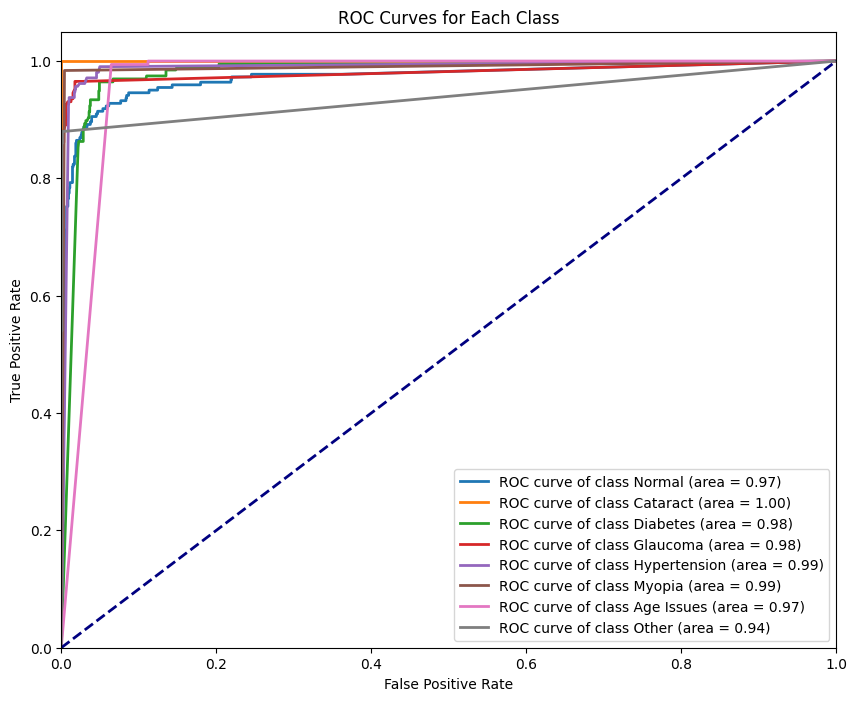

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Binarize the output labels
y_test_bin = label_binarize(np.argmax(y_test_cat, axis=1), classes=np.arange(8))
y_pred_bin = y_pred  # Assuming y_pred contains probabilities for each class

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# **MobileNet**

In [1]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score

In [2]:
# Load MobileNet with pre-trained weights (ImageNet)
mobilenet = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [3]:
mobilenet.summary()

Model: "mobilenet_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,228,864 (12.32 MB)

 Trainable params: 3,206,976 (12.23 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [ ]:
# Freeze base model layers
for layer in mobilenet.layers:
    layer.trainable = False

In [ ]:
x = mobilenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation="relu")(x)
x = Dense(256, activation="relu")(x)
output = Dense(8, activation="softmax")(x)

In [ ]:
final_mobilenet = tf.keras.models.Model(inputs=[mobilenet.input], outputs=[output])

In [ ]:
final_mobilenet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,559,112 (13.58 MB)

 Trainable params: 330,248 (1.26 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
# Compile the model
final_mobilenet.compile(optimizer="adam",
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Train the model
history = final_mobilenet.fit(train_data[0], train_data[1], validation_data=(validation_data[0], validation_data[1]), batch_size=32, epochs=30)

Epoch 1/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 30s 58ms/step - accuracy: 0.3470 - loss: 1.6878 - val_accuracy: 0.4685 - val_loss: 1.3590
Epoch 2/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - accuracy: 0.5092 - loss: 1.2751 - val_accuracy: 0.5337 - val_loss: 1.2039
Epoch 3/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - accuracy: 0.5541 - loss: 1.1524 - val_accuracy: 0.5766 - val_loss: 1.1317
Epoch 4/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.6042 - loss: 1.0433 - val_accuracy: 0.6246 - val_loss: 1.0312
Epoch 5/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - accuracy: 0.6443 - loss: 0.9530 - val_accuracy: 0.6426 - val_loss: 0.9418
Epoch 6/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - accuracy: 0.6635 - loss: 0.8932 - val_accuracy: 0.6640 - val_loss: 0.9077
Epoch 7/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - accuracy: 0.6892 - loss: 0.8155 - val_accuracy: 0.6734 - val_loss: 0.8893
Epoch 8/30
349/349 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.7164 - loss: 0.7447 - va

In [ ]:
# prompt: save model history and weights
import json

# Save the model's training history
with open('mobilenet_history.json', 'w') as f:
    json.dump(history.history, f)

# Save the model weights
final_mobilenet.save_weights('mobilenet.weights.h5')

In [ ]:
final_mobilenet.load_weights("mobilenet.weights.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Evaluate the model
loss, accuracy = final_mobilenet.evaluate(x_test, y_test_cat, verbose=0)
print(f"Test Loss: {loss * 100:.4f}")
print(f"Test Accuracy: {accuracy * 100:.4f}")

Test Loss: 24.3207
Test Accuracy: 89.6848


In [ ]:
# Make predictions
y_pred = final_mobilenet.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test_cat, axis=1)

# Print classification report
print(classification_report(y_true_classes, y_pred_classes, target_names=class_names))

# Calculate and print other metrics
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
print(f"Confusion Matrix:\n{conf_matrix}")


precision = precision_score(y_true_classes, y_pred_classes, average=None)
recall = recall_score(y_true_classes, y_pred_classes, average=None)
f1 = f1_score(y_true_classes, y_pred_classes, average=None)

44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step
              precision    recall  f1-score   support

      Normal       0.80      0.82      0.81       222
    Cataract       1.00      1.00      1.00       157
    Diabetes       0.80      0.68      0.74       197
    Glaucoma       0.92      0.94      0.93       202
Hypertension       0.91      0.97      0.94       209
      Myopia       0.98      0.96      0.97       187
  Age Issues       0.93      0.99      0.96       172
       Other       0.77      0.80      0.78        50

    accuracy                           0.90      1396
   macro avg       0.89      0.89      0.89      1396
weighted avg       0.90      0.90      0.90      1396

Confusion Matrix:
[[181   0  23   3   2   1   5   7]
 [  0 157   0   0   0   0   0   0]
 [ 37   0 134   8  12   2   1   3]
 [  0   0   4 189   2   1   4   2]
 [  0   0   2   3 202   0   2   0]
 [  0   0   4   3   0 179   1   0]
 [  0   0   0   0   2   0 170   0]
 [  9   0   0   0   1   0   0  40]]


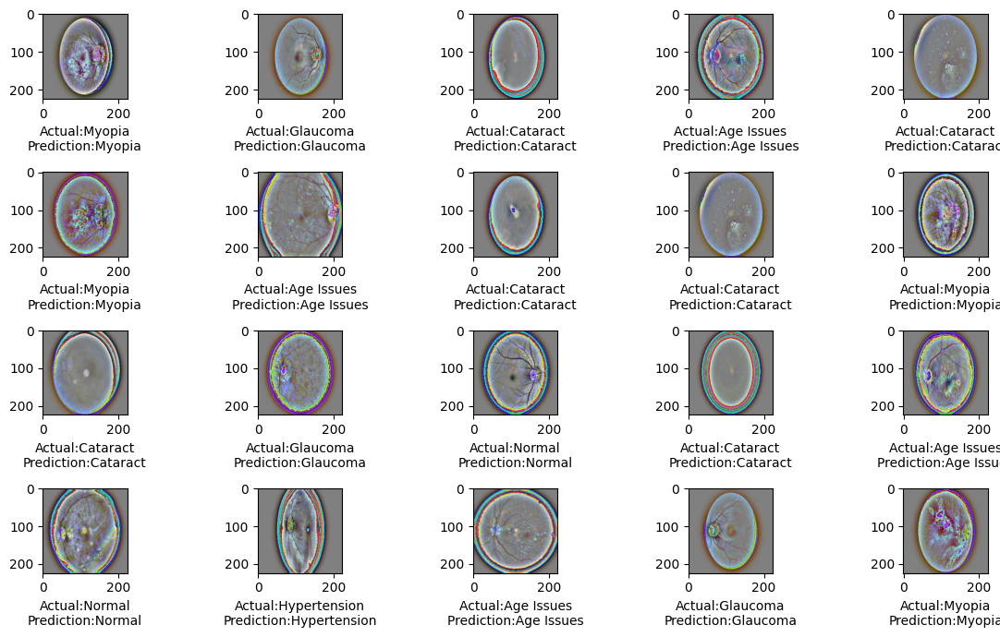

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]

    # Get the predicted class index instead of probabilities
    pred_category = np.argmax(y_pred[sample])


    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

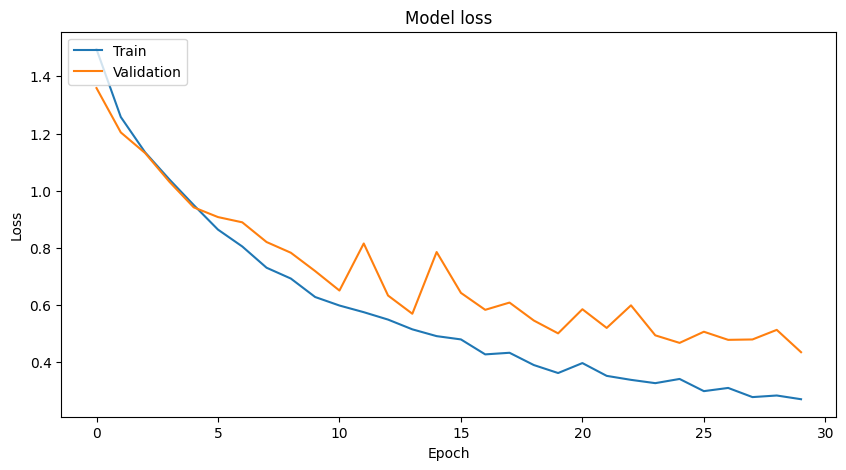

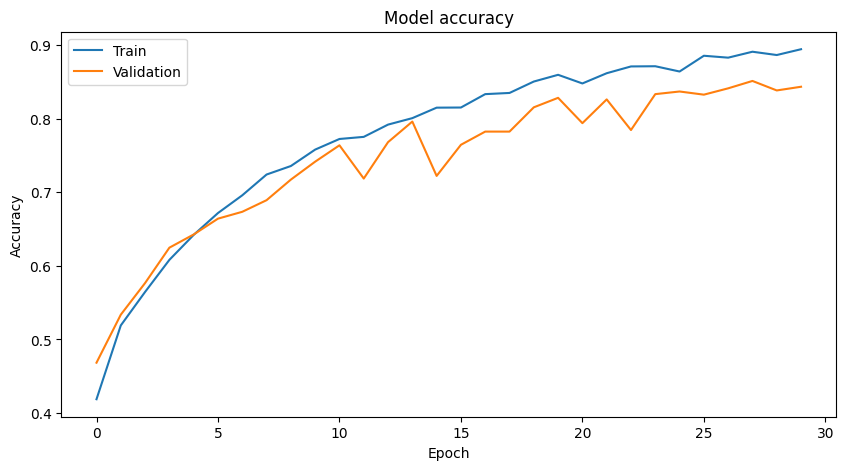

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(10, 5))
plt.plot(history['accuracy'])
plt.plot(history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

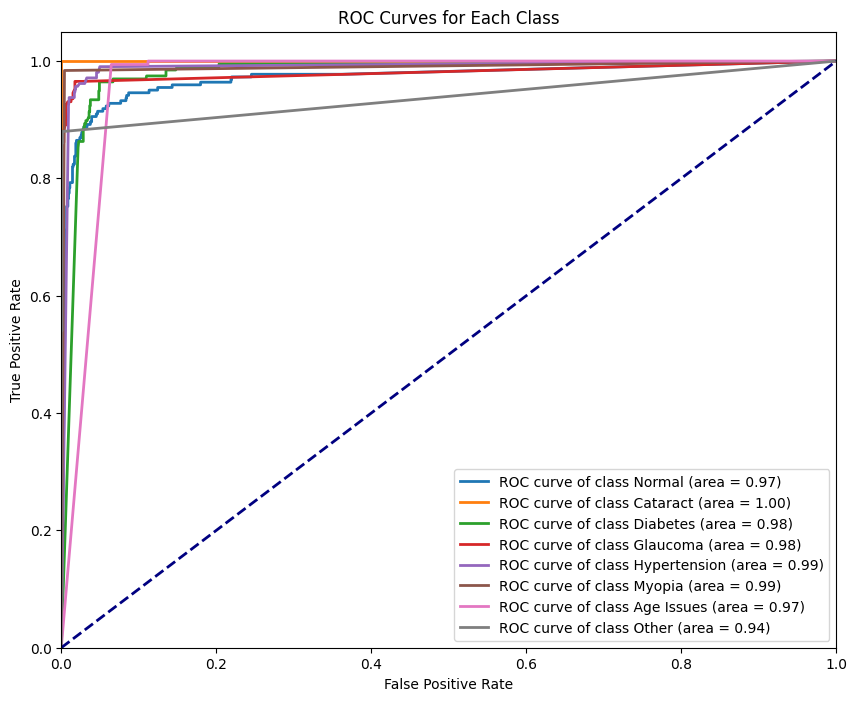

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

# SqueezeNet

In [24]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

In [25]:
squeezenet = models.squeezenet1_1(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [26]:
num_features = squeezenet.classifier[1].in_channels
squeezenet.classifier[1] = nn.Conv2d(num_features, 8, kernel_size=(1, 1), stride=(1, 1))

In [27]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(squeezenet.parameters(), lr=1e-4)

In [28]:
from torchvision import datasets

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])



In [29]:
import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

from PIL import Image

class OcularDataset(Dataset):
    def __init__(self, data, labels, transform=None):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        image = Image.fromarray(self.data[idx].astype('uint8'))

        if self.transform:
            image = self.transform(image)

        label = self.labels[idx]
        if len(label.shape) > 1 and label.shape[-1] > 1:
            label = torch.argmax(torch.tensor(label), dim=-1)
        else:
            label = torch.tensor(label)

        return image, label

train_dataset = OcularDataset(data=x_train, labels=y_train_cat, transform=transform)
val_dataset = OcularDataset(data=x_val, labels=y_val_cat, transform=transform)
test_dataset = OcularDataset(data=x_test, labels=y_test_cat, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
squeezenet = squeezenet.to(device)

In [ ]:
# Training Loop with Metrics Tracking
num_epochs = 25
train_loss_history = []
train_acc_history = []
val_loss_history = []
val_acc_history = []

for epoch in range(num_epochs):
    squeezenet.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = squeezenet(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)

        labels_indices = torch.argmax(labels, dim=1)
        correct += (predicted == labels_indices).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_loss_history.append(train_loss)
    train_acc_history.append(train_acc)

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%', end=" ")

    squeezenet.eval()
    val_running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = squeezenet(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)

            labels_indices = torch.argmax(labels, dim=1)
            correct += (predicted == labels_indices).sum().item()

        val_loss = val_running_loss / len(val_loader)
        val_acc = 100 * correct / total
        val_loss_history.append(val_loss)
        val_acc_history.append(val_acc)

        print(f'Val Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.2f}%')

torch.save(squeezenet.state_dict(), 'squeezenet_model.pth')

Epoch [1/25], Train Loss: 1.3567, Train Acc: 48.59% Val Loss: 1.0929, Validation Accuracy: 59.31%
Epoch [2/25], Train Loss: 0.9710, Train Acc: 64.55% Val Loss: 0.9378, Validation Accuracy: 66.33%
Epoch [3/25], Train Loss: 0.8019, Train Acc: 71.77% Val Loss: 0.8517, Validation Accuracy: 68.55%
Epoch [4/25], Train Loss: 0.6762, Train Acc: 75.68% Val Loss: 0.6772, Validation Accuracy: 74.79%
Epoch [5/25], Train Loss: 0.5712, Train Acc: 79.41% Val Loss: 0.6598, Validation Accuracy: 75.72%
Epoch [6/25], Train Loss: 0.5091, Train Acc: 81.57% Val Loss: 0.5572, Validation Accuracy: 77.58%
Epoch [7/25], Train Loss: 0.4408, Train Acc: 84.38% Val Loss: 0.4849, Validation Accuracy: 81.09%
Epoch [8/25], Train Loss: 0.4038, Train Acc: 85.48% Val Loss: 0.4794, Validation Accuracy: 82.38%
Epoch [9/25], Train Loss: 0.3550, Train Acc: 87.00% Val Loss: 0.5316, Validation Accuracy: 79.87%
Epoch [10/25], Train Loss: 0.3350, Train Acc: 87.93% Val Loss: 0.5825, Validation Accuracy: 78.51%
Epoch [11/25], Trai

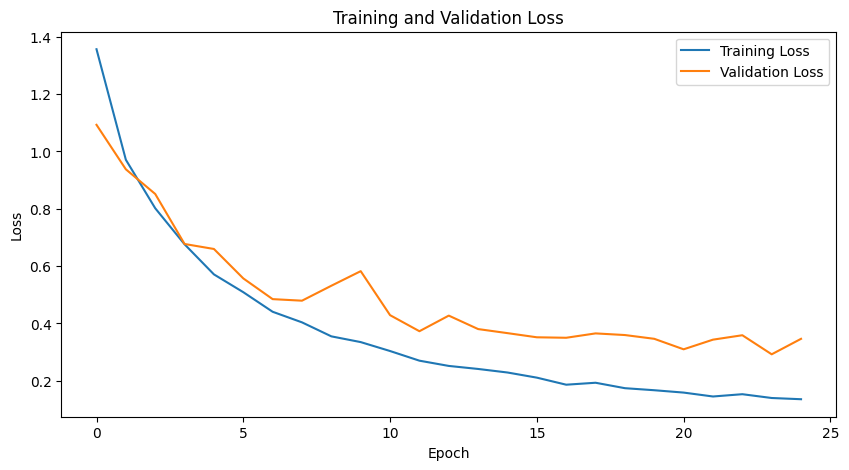

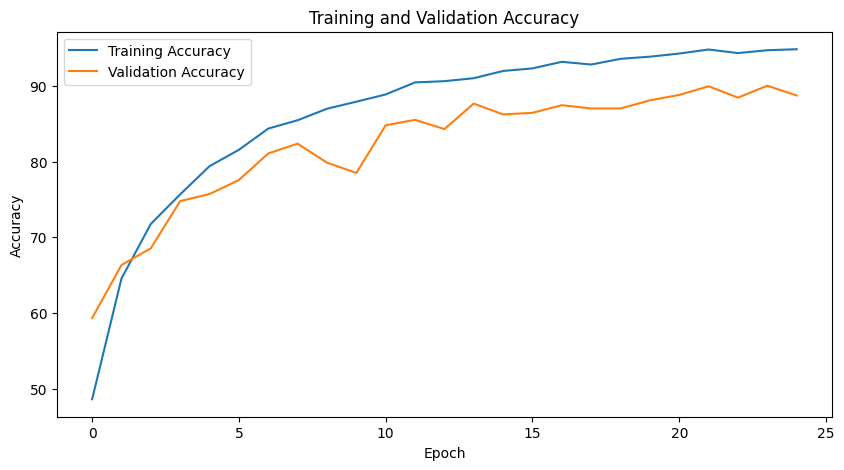

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss_history, label='Training Loss')
plt.plot(val_loss_history, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_acc_history, label='Training Accuracy')
plt.plot(val_acc_history, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
import json

squeezenet_history = {
    'train_loss': train_loss_history,
    'train_accuracy': train_acc_history,
    'val_loss': val_loss_history,
    'val_accuracy': val_acc_history
}
with open('squeezenet_history.json', 'w') as f:
    json.dump(squeezenet_history, f)

In [31]:
squeezenet.load_state_dict(torch.load('squeezenet_model.pth'))

<ipython-input-31-2990fdc8b212>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  squeezenet.load_state_dict(torch.load('squeezenet_model.pth'))


<All keys matched successfully>

In [32]:
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        if len(labels.shape) > 1 and labels.shape[-1] > 1:
            labels = torch.argmax(labels, dim=1)

        outputs = squeezenet(images)
        _, predicted = torch.max(outputs.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Test Accuracy: {100 * correct / total}%')

Test Accuracy: 93.69627507163324%


In [33]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import random
import numpy as np

In [34]:
squeezenet.eval()

y_pred = []
y_true = []

In [35]:
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = squeezenet(images)
        _, predicted = torch.max(outputs.data, 1)


        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())


In [36]:
y_pred = np.array(y_pred)
y_true = np.array(y_true)

In [37]:
if len(y_true.shape) > 1 and y_true.shape[1] > 1:
    y_true = np.argmax(y_true, axis=1)

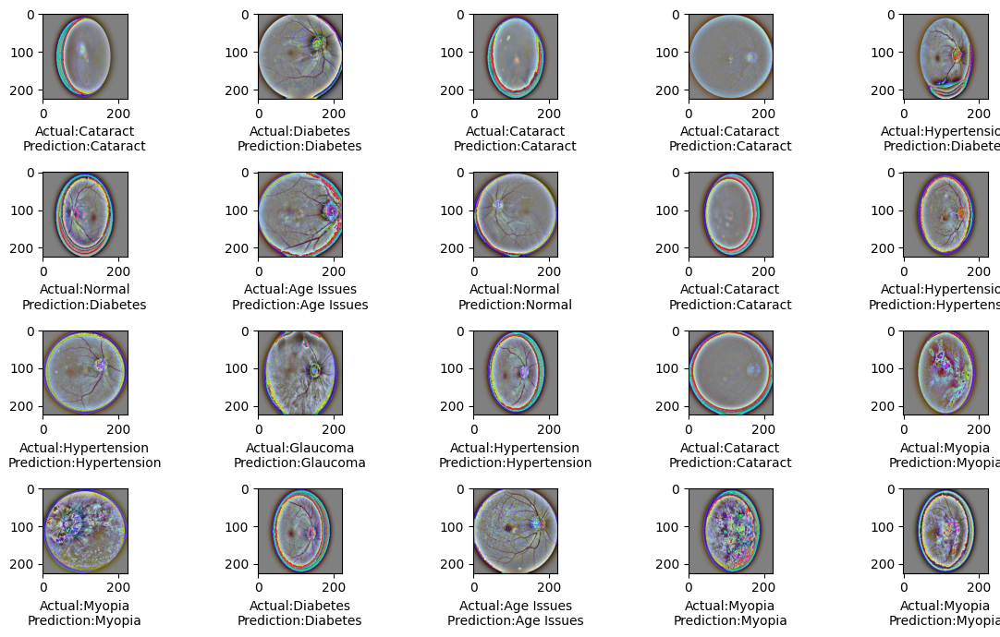

In [ ]:
plt.figure(figsize=(12,7))
for i in range(20):
    sample = random.choice(range(len(x_test)))
    image = x_test[sample]
    category = y_test[sample]
    pred_category = y_pred[sample]

    if category== 0:
        label = "Normal"
    elif category == 1 :
        label = "Cataract"
    elif category == 2:
        label = "Diabetes"
    elif category == 3:
        label = "Glaucoma"
    elif category == 4:
        label = "Hypertension"
    elif category == 5:
        label = "Myopia"
    elif category == 6:
        label = "Age Issues"
    else:
        label = "Other"

    if pred_category== 0:
        pred_label = "Normal"
    elif pred_category == 1 :
        pred_label = "Cataract"
    elif pred_category == 2:
        pred_label = "Diabetes"
    elif pred_category == 3:
        pred_label = "Glaucoma"
    elif pred_category == 4:
        pred_label = "Hypertension"
    elif pred_category == 5:
        pred_label = "Myopia"
    elif pred_category == 6:
        pred_label = "Age Issues"
    else:
        pred_label = "Other"

    plt.subplot(4,5,i+1)
    plt.imshow(image)
    plt.xlabel("Actual:{}\nPrediction:{}".format(label,pred_label))
plt.tight_layout()

In [ ]:
print("Accuracy Score:", accuracy_score(y_true, y_pred))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))
print("Classification Report:")
print(classification_report(y_true, y_pred))

Accuracy Score: 0.8861031518624641
Confusion Matrix:
[[159   4  36  10   2   0  10   1]
 [  0 157   0   0   0   0   0   0]
 [ 20   0 153   9   6   2   5   2]
 [  3   0   2 181   1   3  11   1]
 [  2   0  13   3 186   0   5   0]
 [  0   0   2   1   0 184   0   0]
 [  1   0   0   0   0   0 171   0]
 [  1   0   2   0   0   0   1  46]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       222
           1       0.98      1.00      0.99       157
           2       0.74      0.78      0.76       197
           3       0.89      0.90      0.89       202
           4       0.95      0.89      0.92       209
           5       0.97      0.98      0.98       187
           6       0.84      0.99      0.91       172
           7       0.92      0.92      0.92        50

    accuracy                           0.89      1396
   macro avg       0.89      0.90      0.89      1396
weighted avg       0.89      0.89      0.88    

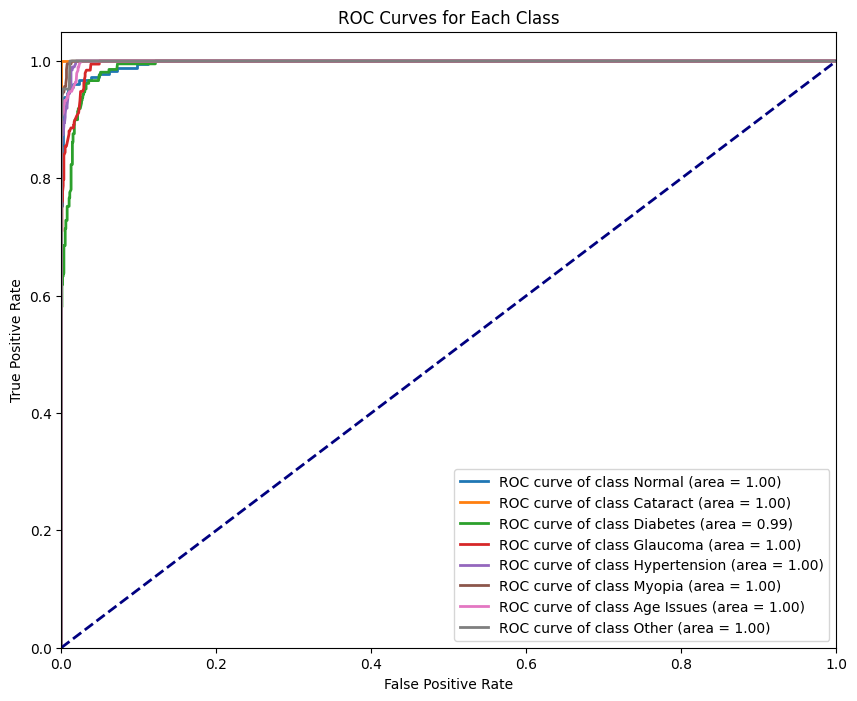

In [40]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np
import torch

class_names = ["Normal", "Cataract", "Diabetes", "Glaucoma", "Hypertension", "Myopia", "Age Issues", "Other"]

# Get predicted probabilities for each class using the trained SqueezeNet model
squeezenet.eval()  # Set the model to evaluation mode
y_pred_probs = []
with torch.no_grad():
    for images, labels in test_loader:  # Assuming you have a test_loader
        images = images.to(device)  # Assuming you have a device (e.g., 'cuda' or 'cpu')
        outputs = squeezenet(images)
        probs = torch.softmax(outputs, dim=1)  # Apply softmax to get probabilities
        y_pred_probs.extend(probs.cpu().numpy())

y_pred_probs = np.array(y_pred_probs)  # Convert to numpy array

# Binarize the output labels
y_test_bin = label_binarize(y_true, classes=np.arange(8))  # Use your actual y_true values
y_pred_bin = y_pred_probs # Replace with the actual predicted probabilities from your model


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(8):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
for i in range(8):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Each Class')
plt.legend(loc="lower right")
plt.show()

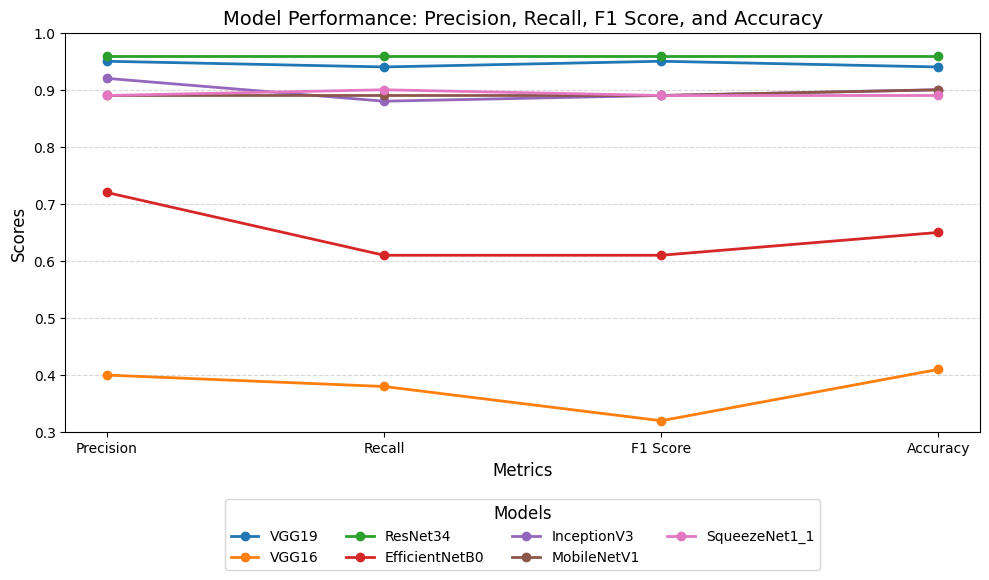

In [15]:
import matplotlib.pyplot as plt

# Metrics data
models = ['VGG19', 'VGG16', 'ResNet34', 'EfficientNetB0', 'InceptionV3', 'MobileNetV1', 'SqueezeNet1_1']
metrics = ['Precision', 'Recall', 'F1 Score', 'Accuracy']
data = [
    [0.95, 0.94, 0.95, 0.94],  # VGG19
    [0.40, 0.38, 0.32, 0.41],  # VGG16
    [0.96, 0.96, 0.96, 0.96],  # ResNet34
    [0.72, 0.61, 0.61, 0.65],  # EfficientNetB0
    [0.92, 0.88, 0.89, 0.90],  # InceptionV3
    [0.89, 0.89, 0.89, 0.90],  # MobileNetV1
    [0.89, 0.90, 0.89, 0.89],  # SqueezeNet1_1
]

# Define simple distinct colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

# Create the figure and axis
plt.figure(figsize=(10, 6))

# Plot each model's metrics
for i, model in enumerate(models):
    plt.plot(metrics, data[i], label=model, color=colors[i], linewidth=2, marker='o', markersize=6)

# Add title, labels, and legend
plt.title('Model Performance: Precision, Recall, F1 Score, and Accuracy', fontsize=14)
plt.xlabel('Metrics', fontsize=12)
plt.ylabel('Scores', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ylim(0.3, 1)  # Zoom in on the range of interest
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Models", fontsize=10, title_fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)
plt.tight_layout()

# Show the plot
plt.show()
